# Mercedes-Benz Greener Manufacturing
##### Can you cut the time a Mercedes-Benz spends on the test bench?

https://www.kaggle.com/competitions/mercedes-benz-greener-manufacturing

Since the first automobile, the Benz Patent Motor Car in 1886, Mercedes-Benz has stood for important automotive innovations. These include, for example, the passenger safety cell with crumple zone, the airbag and intelligent assistance systems. Mercedes-Benz applies for nearly 2000 patents per year, making the brand the European leader among premium car makers. Daimler’s Mercedes-Benz cars are leaders in the premium car industry. With a huge selection of features and options, customers can choose the customized Mercedes-Benz of their dreams. .

To ensure the safety and reliability of each and every unique car configuration before they hit the road, Daimler’s engineers have developed a robust testing system. But, optimizing the speed of their testing system for so many possible feature combinations is complex and time-consuming without a powerful algorithmic approach. As one of the world’s biggest manufacturers of premium cars, safety and efficiency are paramount on Daimler’s production lines.

In this competition, Daimler is challenging Kagglers to tackle the curse of dimensionality and reduce the time that cars spend on the test bench. Competitors will work with a dataset representing different permutations of Mercedes-Benz car features to predict the time it takes to pass testing. Winning algorithms will contribute to speedier testing, resulting in lower carbon dioxide emissions without reducing Daimler’s standards.

Submissions are evaluated on the R^2 value, also called the coefficient of determination.

##### see various automl library comparison on the same datasets https://mljar.com/automl-compare/

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score

from supervised import AutoML

import os

### Get Dataset

In [2]:
base_folder = "D:\data_dump\kaggle-datasets\mercedes-benz-greener-manufacturing"
train_data = pd.read_csv(os.path.join(base_folder, 'train.csv'))
test_data = pd.read_csv(os.path.join(base_folder, 'test.csv'))

print(train_data.shape)
print(test_data.shape)

(4209, 378)
(4209, 377)


In [3]:
#find nas or null
print(train_data.isna().values.sum())
print(train_data.isnull().values.sum())
print(test_data.isnull().values.sum())
print(test_data.isnull().values.sum())

0
0
0
0


In [4]:
train_data.describe()

,ID,y,X10,X11,X12,X13,X14,X15,X16,X17,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
count,4209.000000,4209.000000,4209.000000,4209.0,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,...,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000
mean,4205.960798,100.669318,0.013305,0.0,0.075077,0.057971,0.428130,0.000475,0.002613,0.007603,...,0.318841,0.057258,0.314802,0.020670,0.009503,0.008078,0.007603,0.001663,0.000475,0.001426
std,2437.608688,12.679381,0.114590,0.0,0.263547,0.233716,0.494867,0.021796,0.051061,0.086872,...,0.466082,0.232363,0.464492,0.142294,0.097033,0.089524,0.086872,0.040752,0.021796,0.037734
min,0.000000,72.110000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2095.000000,90.820000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4220.000000,99.150000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6314.000000,109.010000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8417.000000,265.320000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
train_data.head()

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,...,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,...,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,...,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,...,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,...,0,0,0,0,0,0,0,0,0,0


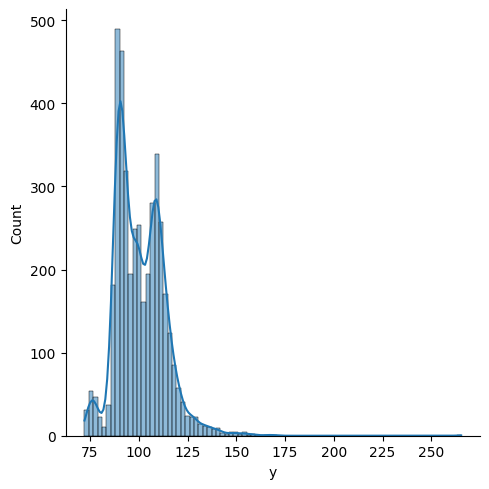

In [6]:
sns.displot(data=train_data, x='y', kde=True)

### Training

In [11]:
def display_metrics(y_true, y_hat):
    print(f'Mean absolute error is {round(mean_absolute_error(y_true, y_hat), 4)}')
    print(f'Mean absolute percentage error is {round(mean_absolute_percentage_error(y_true, y_hat), 4)}')
    print(f'Mean square error is {round(mean_squared_error(y_true, y_hat), 4)}')
    print(f'Root mean square error is {round(np.sqrt(mean_squared_error(y_true, y_hat)), 4)}')
    print(f'R2 score is {round(r2_score(y_true, y_hat), 4)}')
    # plot the residual
    sns.displot(y_true - y_hat, kde=True)


In [8]:
# train_data.ID.value_counts() shows that ID is an identity field. So we will remove such
X_train = train_data.drop(columns=['ID', 'y'])
y_train = train_data['y']

automl = AutoML(mode="Perform", 
                results_path="mercedes-benz-greener-manufacturing", 
                eval_metric='r2', 
                total_time_limit=3*3600)
automl.fit(X_train, y_train)

AutoML directory: mercedes-benz-greener-manufacturing
The task is regression with evaluation metric r2
AutoML will use algorithms: ['Linear', 'Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
* Step simple_algorithms will try to check up to 1 model
1_Linear r2 -7.023171973346627e+19 trained in 67.05 seconds (1-sample predict time 0.5817 seconds)
* Step default_algorithms will try to check up to 5 models
2_Default_LightGBM r2 0.54832 trained in 118.72 seconds (1-sample predict time 0.639 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mlja

3_Default_Xgboost r2 0.55395 trained in 120.73 seconds (1-sample predict time 0.586 seconds)
4_Default_CatBoost r2 0.568655 trained in 100.98 seconds (1-sample predict time 0.417 seconds)
5_Default_NeuralNetwork r2 0.514797 trained in 65.26 seconds (1-sample predict time 0.6 seconds)
6_Default_RandomForest r2 0.568653 trained in 145.41 seconds (1-sample predict time 0.4674 seconds)
* Step not_so_random will try to check up to 20 models
11_LightGBM r2 0.562114 trained in 113.37 seconds (1-sample predict time 0.5786 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mlja

7_Xgboost r2 0.545158 trained in 122.2 seconds (1-sample predict time 0.5817 seconds)
15_CatBoost r2 0.567877 trained in 233.58 seconds (1-sample predict time 0.4896 seconds)
19_RandomForest r2 0.568658 trained in 195.89 seconds (1-sample predict time 0.4939 seconds)
23_NeuralNetwork r2 0.49279 trained in 63.65 seconds (1-sample predict time 0.4844 seconds)
12_LightGBM r2 0.543863 trained in 100.31 seconds (1-sample predict time 0.5893 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
C:\Users\okmic\.conda\envs\mlja

8_Xgboost r2 0.541413 trained in 118.62 seconds (1-sample predict time 0.5736 seconds)
16_CatBoost r2 0.540398 trained in 117.33 seconds (1-sample predict time 0.3558 seconds)
20_RandomForest r2 0.566396 trained in 5341.66 seconds (1-sample predict time 0.4348 seconds)
* Step golden_features will try to check up to 3 models
None 35
Add Golden Feature: X127_diff_X232
Add Golden Feature: X263_sum_X127
Add Golden Feature: X127_diff_X279
Add Golden Feature: X29_diff_X127
Add Golden Feature: X54_diff_X127
Add Golden Feature: X76_diff_X127
Add Golden Feature: X136_sum_X127
Add Golden Feature: X127_diff_X328
Add Golden Feature: X127_diff_X276
Add Golden Feature: X127_diff_X162
Add Golden Feature: X127_diff_X272
Add Golden Feature: X314_diff_X315
Add Golden Feature: X232_sum_X127
Add Golden Feature: X127_sum_X29
Add Golden Feature: X279_sum_X127
Add Golden Feature: X127_diff_X263
Add Golden Feature: X127_diff_X166
Add Golden Feature: X315_sum_X314
Add Golden Feature: X127_sum_X76
Add Golden Fe

AutoML(eval_metric='r2', mode='Perform',
       results_path='mercedes-benz-greener-manufacturing',
       total_time_limit=10800)

In [9]:
automl.get_leaderboard().sort_values(by=['metric_value', 'single_prediction_time'])

,name,model_type,metric_type,metric_value,train_time,single_prediction_time
24,33_CatBoost,CatBoost,r2,-5.716975e-01,190.99,0.9326
15,19_RandomForest_GoldenFeatures,Random Forest,r2,-5.713695e-01,502.57,1.3515
23,31_RandomForest_GoldenFeatures,Random Forest,r2,-5.708007e-01,423.05,1.3625
17,25_RandomForest_GoldenFeatures,Random Forest,r2,-5.702352e-01,396.76,1.3080
19,27_RandomForest,Random Forest,r2,-5.693467e-01,347.66,0.9466
25,34_CatBoost,CatBoost,r2,-5.692752e-01,207.10,0.8671
26,35_CatBoost,CatBoost,r2,-5.692189e-01,237.33,0.3550
27,Ensemble,Ensemble,r2,-5.692189e-01,0.18,0.4050
16,24_RandomForest_GoldenFeatures,Random Forest,r2,-5.689459e-01,440.36,1.3259
9,19_RandomForest,Random Forest,r2,-5.686581e-01,196.71,0.4939


Mean absolute error is 5.1049
Mean absolute percentage error is 0.0485
Mean square error is 63.8941
Root mean square error is 7.9934
R2 score is 0.6025


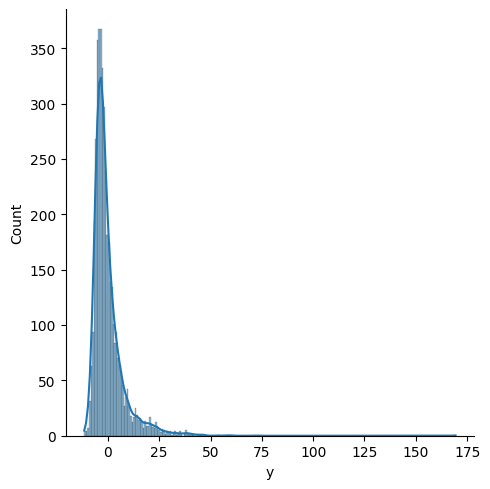

In [12]:
y_train_pred = automl.predict(train_data.drop(columns=['ID', 'y']))
display_metrics(train_data['y'], y_train_pred)

### Prediction on test set

In [18]:
y_test_hat = automl.predict(test_data.drop(columns=['ID']))
submission = pd.DataFrame({
    'ID' : test_data['ID'],
    'y' :  y_test_hat
})

In [19]:
submission.head(20)

,ID,y
0,1,83.768584
1,2,98.014805
2,3,83.707331
3,4,78.784965
4,5,111.635473
5,8,92.971720
6,10,111.323668
7,11,93.929954
8,12,116.738308
9,14,94.120567


### Report

In [20]:
automl.report()

Best model,name,model_type,metric_type,metric_value,train_time,single_prediction_time
,1_Linear,Linear,r2,-7.02317e+19,67.93,0.5817
,2_Default_LightGBM,LightGBM,r2,0.54832,119.68,0.639
,3_Default_Xgboost,Xgboost,r2,0.55395,121.67,0.586
,4_Default_CatBoost,CatBoost,r2,0.568655,102,0.417
,5_Default_NeuralNetwork,Neural Network,r2,0.514797,66.14,0.6
,6_Default_RandomForest,Random Forest,r2,0.568653,146.35,0.4674
,11_LightGBM,LightGBM,r2,0.562114,114.28,0.5786
,7_Xgboost,Xgboost,r2,0.545158,123.16,0.5817
,15_CatBoost,CatBoost,r2,0.567877,234.5,0.4896
,19_RandomForest,Random Forest,r2,0.568658,196.71,0.4939
